In [1]:
import sys
sys.stdout = open('prints.txt', 'w')
from utils import save_path_generator, get_all_info, visualize, visualize_interact, wave_transform, detector_image
from ganrec2 import tfnor_phase, GANphase, ssim_check
import tensorflow as tf
import time
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 
from skimage import io as io
import numpy as np

2023-06-17 18:31:41.475203: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudart.so.10.1


# Running GANPhase for two datas

> #### <u> 1. Projection of phantom object at P05 - 18 KEV </u>

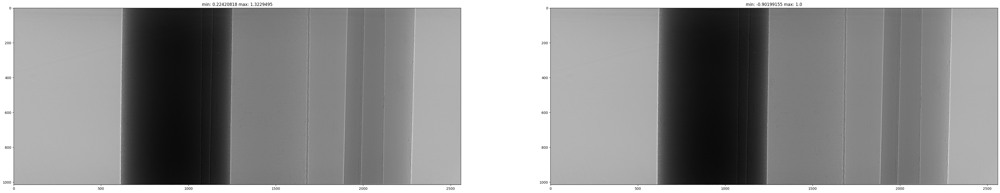

In [3]:
path = "/asap3/petra3/gpfs/p05/2023/data/11016663//processed/thomas_001_d150/flat_corrected/rawBin2"
pad = 4.97766
idx = 2
images = io.imread_collection(path + '/*.tif')
kwargs = get_all_info(path = path, idx = idx, energy_kev = 18.0, detector_pixel_size = 2.57 * 1e-6, distance_sample_detector = 0.15, alpha = 1e-8, delta_beta = 1, pad = 1, method = 'TIE', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None)


energy = kwargs["energy_kev"]
lam = kwargs["lam"]
z = kwargs["distance_sample_detector"]
pv = kwargs["detector_pixel_size"]
px = kwargs["shape_x"]
py = kwargs["shape_y"]
image = kwargs["image"]

data = tfnor_phase(tf.reshape(image, [1, px, py, 1]))[0,:,:,0]

kwargs["i_input"] = data
kwargs["z"] = kwargs["distance_sample_detector"]
kwargs["lam"] = kwargs["lam"]
kwargs["pv"] = kwargs["detector_pixel_size"]

save_path = save_path_generator(**kwargs)
kwargs['save_path'] = save_path
print("******************************\n \tThe input is image with shape {}".format(image.shape), "at energy {} kev".format(energy), "with pixel size {} m".format(pv), "and distance {} m".format(z), "min/max of image" , np.min(image), np.max(image), "\n******************************")
visualize([image, data])


2023-06-17 18:33:24.981513: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:116] None of the MLIR optimization passes are enabled (registered 2)
2023-06-17 18:33:25.086406: I tensorflow/core/platform/profile_utils/cpu_utils.cc:112] CPU Frequency: 2400000000 Hz
2023-06-17 18:33:25.974933: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcublas.so.10
2023-06-17 18:33:27.676954: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcudnn.so.7
2023-06-17 18:33:33.605237: I tensorflow/stream_executor/platform/default/dso_loader.cc:49] Successfully opened dynamic library libcufft.so.10


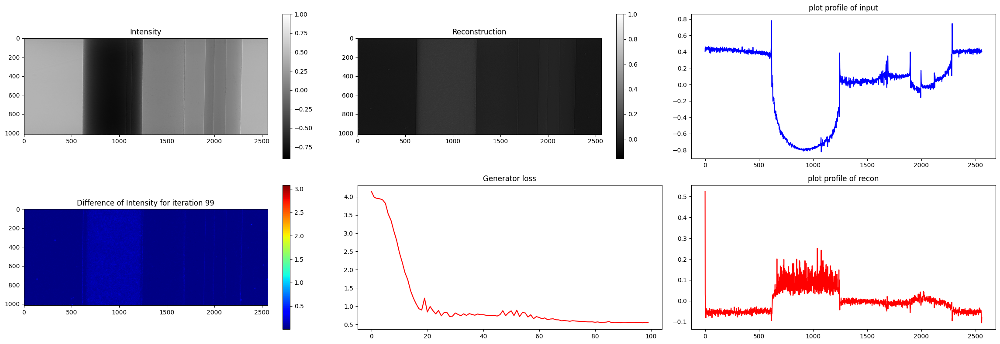

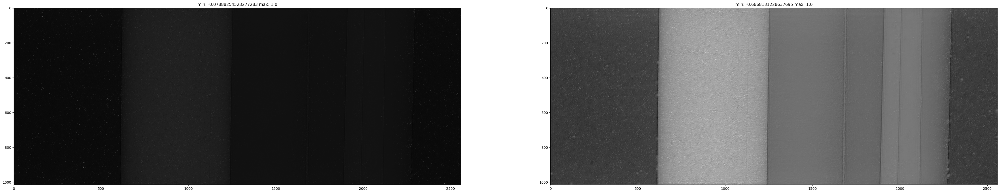

In [4]:
gan_phase_object_phantom = GANphase(**kwargs)
start = time.time()
rec_phantom = gan_phase_object_phantom.recon
end = time.time()

file_name = 'phantom'
print('Running time is {}'.format(end - start), 'saving to {}'.format(save_path))
io.imsave(save_path + file_name+'_final_phase.tif', rec_phantom[1], check_contrast=False)
io.imsave(save_path + file_name+'_final_absorption.tif', rec_phantom[0], check_contrast=False)


Final reconstruction and ssim check

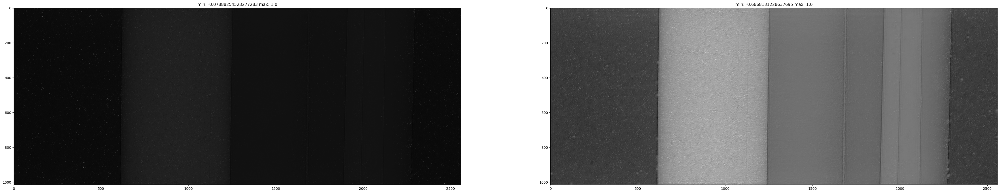

In [7]:
#SSIM between the input image and the lib.detected_image(rec_phantom[1], rec_phantom[0])

def ssim_check(image, rec_phantom):
    wave = tf.cast(tf.exp(tf.complex(-rec_phantom[0], rec_phantom[1])), dtype = tf.complex64)
    intensity = tfnor_phase(tf.reshape(tf.cast(tf.abs(wave)**2, dtype = tf.float32), [1, px, py, 1]))
    data_im = tfnor_phase(tf.reshape(image, [1, px, py, 1]))
    ssim = tf.image.ssim(data_im, intensity, max_val = 1.0)
 
    print("SSIM between the input image and the reconstructed image is {}".format(ssim))
    return ssim
ssim_check(image, rec_phantom)
visualize(rec_phantom)


### what if we use the model to predict an other projection

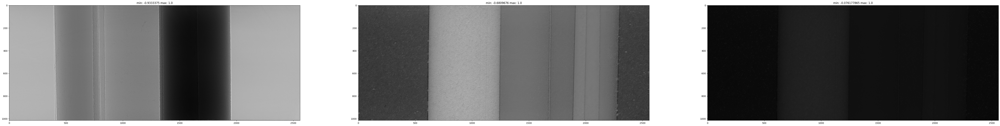

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.02834161], dtype=float32)>

In [8]:
#use the trained model to retrieve the phase of another
idx = 1000
image2 = get_all_info(path = path, idx = idx, energy_kev = 18.0, detector_pixel_size = 2.57 * 1e-6, distance_sample_detector = 0.15, alpha = 1e-8, delta_beta = 1, pad = 1, method = 'TIE', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None)['image']
data2 = tfnor_phase(tf.reshape(image2, [1, px, py, 1]))[0,:,:,0]
#predict the phase and absorption
rec2= gan_phase_object_phantom.generator(tf.reshape(image2, [1, px, py, 1]))
phase2 = tfnor_phase(rec2[:, :, :, 0]) 
absorption2 = tfnor_phase(rec2[:, :, :, 1])
visualize([data2, phase2[0], absorption2[0]])
ssim_check(image2, [absorption2[0], phase2[0]])

> <b> We see that the prediction is not a good one </b>

#### Retraining with loaded genator

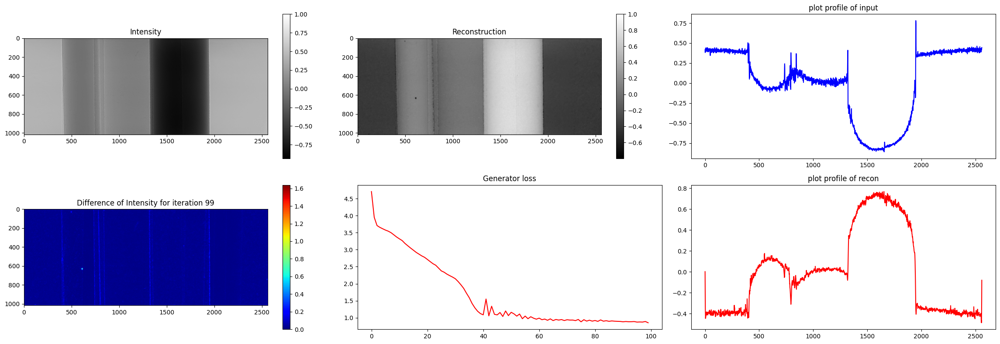

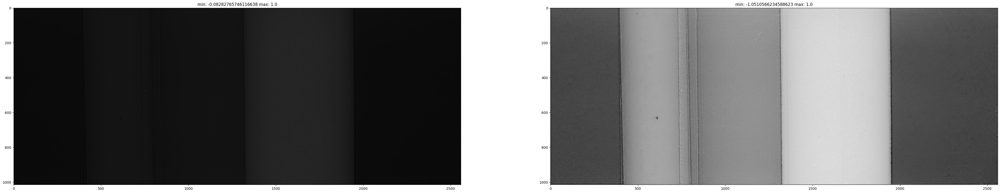

In [9]:
kwargs["i_input"] = data2
kwargs["init_model"] = True
idx = 1000
image2 = get_all_info(path = path, idx = idx, energy_kev = 18.0, detector_pixel_size = 2.57 * 1e-6, distance_sample_detector = 0.15, alpha = 1e-8, delta_beta = 1, pad = 1, method = 'TIE', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None)['image']
data2 = tfnor_phase(tf.reshape(image2, [1, px, py, 1]))[0,:,:,0]
gan_phase_object_phantom = GANphase(**kwargs)
start_time = time.time()
rec2 = gan_phase_object_phantom.recon
total_time = time.time() - start_time
print("Running time is {}".format(total_time))



In [13]:
ssim_check(data2, rec2)
visualize(rec2)

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.75097364], dtype=float32)>

# Prediction after only few iterations in the end

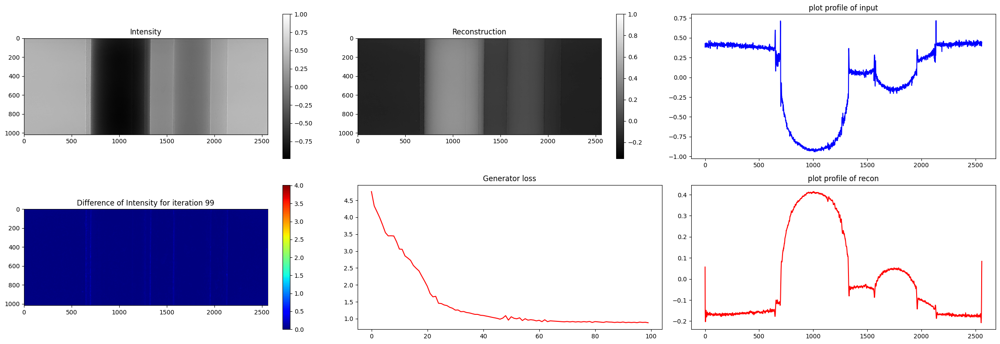

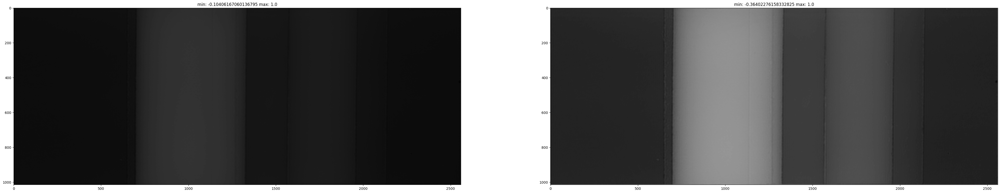

In [18]:
kwargs["i_input"] = data2
kwargs["init_model"] = True
kwargs['iter_num'] = 120
idx = 1500
image2 = get_all_info(path = path, idx = idx, energy_kev = 18.0, detector_pixel_size = 2.57 * 1e-6, distance_sample_detector = 0.15, alpha = 1e-8, delta_beta = 1, pad = 1, method = 'TIE', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None)['image']
data2 = tfnor_phase(tf.reshape(image2, [1, px, py, 1]))[0,:,:,0]
gan_phase_object_phantom = GANphase(**kwargs)
start_time = time.time()
rec2 = gan_phase_object_phantom.recon
total_time = time.time() - start_time
print("Running time is {}".format(total_time))
visualize(rec2)

In [19]:
ssim_check(data2, rec2)

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.7449184], dtype=float32)>

> ## <u> 2. For simulated data projected at z </u>

In [25]:

energy = 10
z = 0.5
pv = 5e-7
fname_data = '/home/hailudaw/hailudaw/ml_for_phase/propagations_2000/propagation_260.tif'
kwargs = get_all_info(images = [fname_data], idx = 0, energy_kev = energy, detector_pixel_size = pv, distance_sample_detector = z, alpha = 1e-8, delta_beta = 1, pad = 1, method = 'TIE', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None)
px = kwargs['shape'][0]
py = kwargs['shape'][1]
data = tfnor_phase(tf.reshape(kwargs['image'], [1, px, py, 1]))[0,:,:,0]
kwargs["i_input"] = data
kwargs["z"] = kwargs["distance_sample_detector"]
kwargs["lam"] = kwargs["lam"]
kwargs["pv"] = kwargs["detector_pixel_size"]
kwargs["init_model"] = False
save_path = save_path_generator(**kwargs)
kwargs["save_path"] = save_path
print("******************************\n \tThe input is image with shape {}".format(kwargs['image'].shape), "at energy {} kev".format(energy), "with pixel size {} m".format(pv), "and distance {} m".format(z), "min/max of image" , np.min(kwargs['image']), np.max(kwargs['image']), "\n******************************")

In [ ]:
# energy = 10
# z = 0.5
# pv = 5e-7
# fname_data = '/home/hailudaw/hailudaw/ml_for_phase/propagations_2000/propagation_260.tif'
# input = io.imread(fname_data)
# px, py = input.shape

# data = tfnor_phase(tf.reshape(input, [1, input.shape[0], input.shape[1], 1]))[0, :, :, 0]
# visualizeput, data])
# kwargs = get_all_info(images = fname_data, idx = None, energy_kev = energy, detector_pixel_size = pv, distance_sample_detector = z, alpha = 1e-8, delta_beta = 1, pad = 1, method = 'TIE', image = None, phase_path= None, attenuation_path = None, phase_image = None, attenuation_image = None)

# gan_phase_object_sim = GANphase(data, energy, z, pv)
# start = time.time()
# rec_sim = gan_phase_object_sim.recon
# end = time.time()

# if 'save_path' in kwargs:
#     save_path = kwargs['save_path']
# else:
#     save_path = os.getcwd() + '/data/ganrec/recon/'

# if not os.path.exists(save_path):
#     os.makedirs(save_path)
# if 'save_wpath' in kwargs:
#     save_wpath = kwargs['save_wpath']
# else:
#     kwargs['save_wpath'] = save_path

# file_name = 'simulated'
# print('Running time is {}'.format(end - start), 'saving to {}'.format(save_path))
# io.imsave(save_path + file_name+'_final_phase.tif', rec_sim[1], check_contrast=False)
# io.imsave(save_path + file_name+'_final_absorption.tif', rec_sim[0], check_contrast=False)
# visualize(rec_phantom)

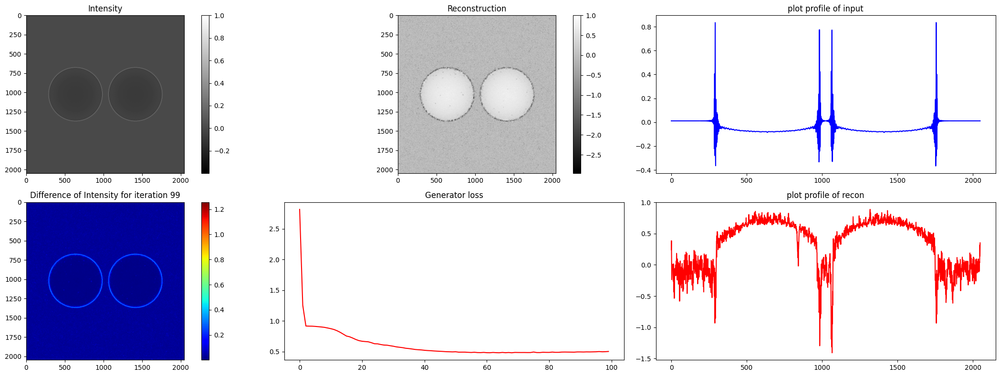

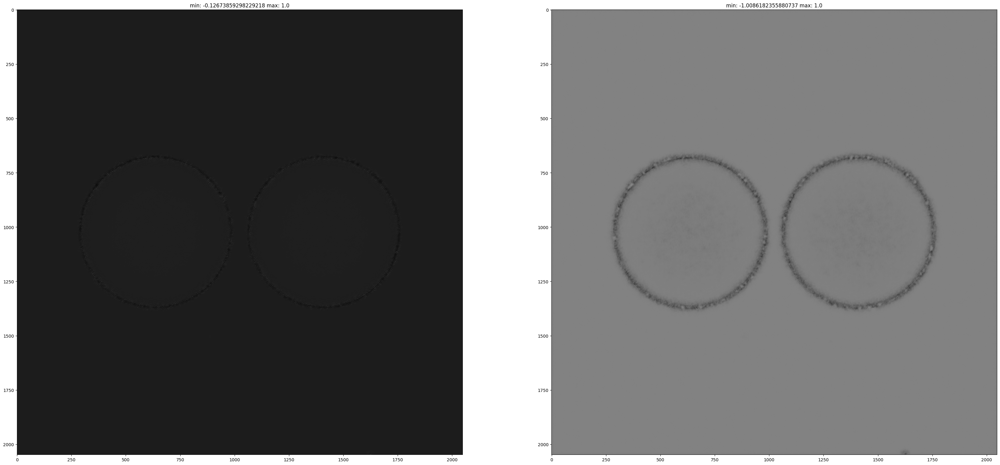

In [27]:
gan_phase_object_phantom = GANphase(**kwargs)
start_time = time.time()
rec2 = gan_phase_object_phantom.recon
total_time = time.time() - start_time
print("Running time is {}".format(total_time))
visualize2)


In [29]:
ssim_check(data, rec2)

<tf.Tensor: shape=(1,), dtype=float32, numpy=array([0.9301318], dtype=float32)>

### <u> Prevous attemps </u>

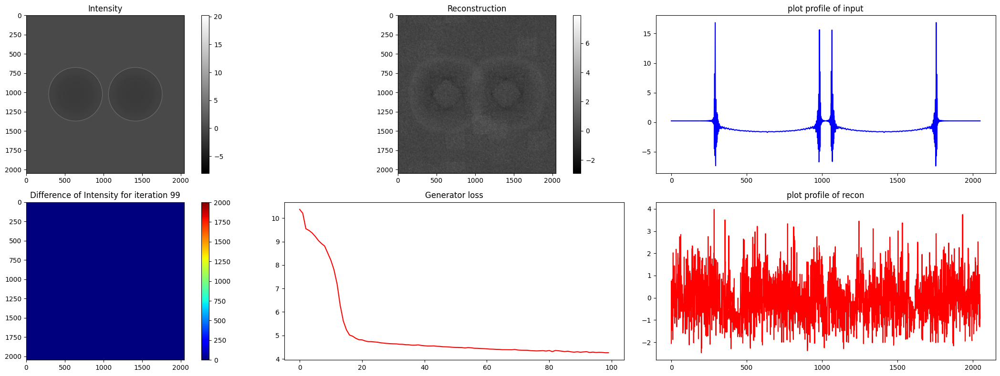

In [ ]:
gan_phase_object = GANphase(**kwargs)
start = time.time()
rec = gan_phase_object.recon
end = time.time()

print('Running time is {}'.format(end - start))
io.imsave(save_path + 'sim_phase_2.tif', rec[1], check_contrast=False)
io.imsave(save_path + 'sim_absorption_2.tif', rec[0], check_contrast=False)


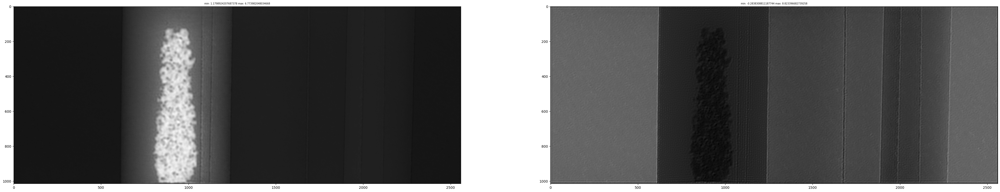

In [65]:
visualize)

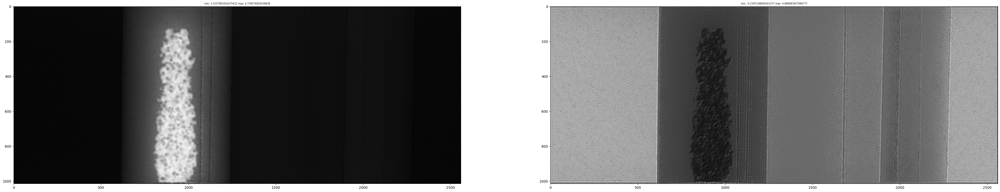

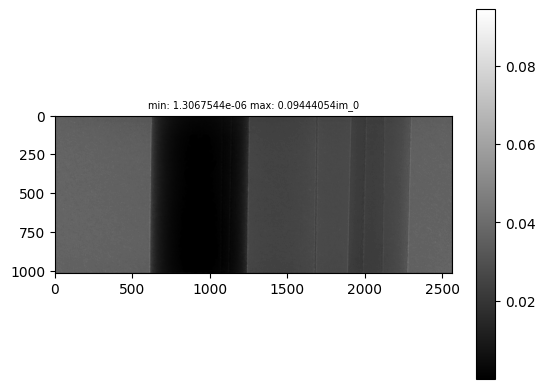

RuntimeError: No mappable was found to use for colorbar creation. First define a mappable such as an image (with imshow) or a contour set (with contourf).

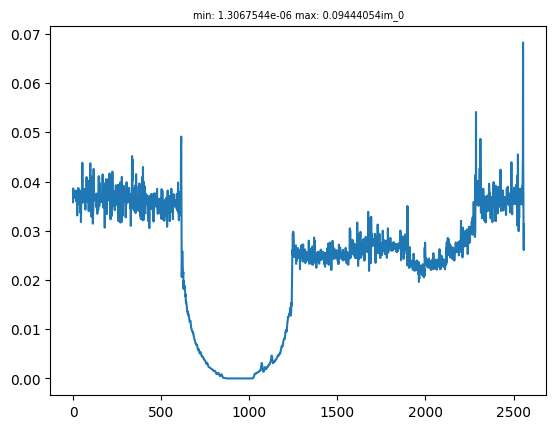

In [68]:
#median filter 
import fresnel as fr
import scipy.ndimage as ndimage
rec_filtered = ndimage.median_filter(rec, size=3)
wavefront = fr.wave_transform(rec[1], rec[0], 1)
visualize_filtered)
visualize.detector_image(wavefront)], show_or_plot = 'show')
visualize.detector_image(wavefront)], show_or_plot = 'plot')

In [71]:

print('Running time is {}'.format(end - start))
io.imsave('data/ganrec/recon/phantom_phase_2.tif', rec[1], check_contrast=False)
io.imsave('data/ganrec/recon/absorption_phase_2.tif', rec[0], check_contrast=False)
